# Urban Greenary Analysis

Data: 

1. trees data: https://www.data.gov.uk/dataset/df223a81-879f-46a0-88db-4417069ea8c4/local-authority-maintained-trees
   
2. London Population data: https://www.citypopulation.de/en/uk/greaterlondon/

3. London Boroughs: https://data.london.gov.uk/dataset/london_boroughs

In [3]:
import pandas as pd
import pyproj
import geopandas as gpd
import matplotlib.pyplot as plt 
import contextily as cx
import folium
from folium.plugins import MarkerCluster
import geopandas as gpd
from shapely.geometry import mapping

## Spatial data of trees in London

In [5]:
trees = pd.read_csv("Borough_tree_list_2021July.csv")

C:\Users\bhagy\AppData\Local\Temp\ipykernel_9152\852865566.py:1: DtypeWarning: Columns (7,8,9,11,13,16) have mixed types. Specify dtype option on import or set low_memory=False.
  trees = pd.read_csv("Borough_tree_list_2021July.csv")


In [6]:
trees.head(3)

,objectid,borough,maintainer,gla_tree_name,tree_name,taxon_name,common_name,age,age_group,height_m,spread_m,canopy_spread_group,diameter_at_breast_height_cm,dbh_group,longitude,latitude,condition,load_date,updated
0,1,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Early mature (16-30),10 to 15m,NaN,00 to 05m,NaN,21 to 40cm,-0.291147,51.361893,Reasonable,20210318,20210715
1,2,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Early mature (16-30),10 to 15m,NaN,00 to 05m,NaN,21 to 40cm,-0.291122,51.361914,Reasonable,20210318,20210715
2,3,Kingston upon Thames,Royal Borough of Kingston upon Thames,Other,NaN,Abies grandis,Grand fir,NaN,Early mature (16-30),05 to 10m,NaN,05 to 10m,NaN,21 to 40cm,-0.290943,51.387016,Reasonable,20210318,20210715


In [7]:
trees.shape

(817150, 19)

In [8]:
trees.columns

Index(['objectid', 'borough', 'maintainer', 'gla_tree_name', 'tree_name',
       'taxon_name', 'common_name', 'age', 'age_group', 'height_m', 'spread_m',
       'canopy_spread_group', 'diameter_at_breast_height_cm', 'dbh_group',
       'longitude', 'latitude', 'condition', 'load_date', 'updated'],
      dtype='object')

In [9]:
trees = trees.drop(['gla_tree_name', 'tree_name', 'age', 'spread_m', 'diameter_at_breast_height_cm', 'load_date','updated'], axis=1)

In [10]:
trees.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817150 entries, 0 to 817149
Data columns (total 12 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   objectid             817150 non-null  int64  
 1   borough              817150 non-null  object 
 2   maintainer           817150 non-null  object 
 3   taxon_name           766107 non-null  object 
 4   common_name          682231 non-null  object 
 5   age_group            229336 non-null  object 
 6   height_m             103218 non-null  object 
 7   canopy_spread_group  18175 non-null   object 
 8   dbh_group            18175 non-null   object 
 9   longitude            817150 non-null  float64
 10  latitude             817150 non-null  float64
 11  condition            18175 non-null   object 
dtypes: float64(2), int64(1), object(9)
memory usage: 74.8+ MB


In [11]:
trees.isnull().sum()

objectid                    0
borough                     0
maintainer                  0
taxon_name              51043
common_name            134919
age_group              587814
height_m               713932
canopy_spread_group    798975
dbh_group              798975
longitude                   0
latitude                    0
condition              798975
dtype: int64

In [12]:
borough_tree_counts = trees.groupby('borough').size().reset_index(name='tree_count')

In [13]:
borough_tree_counts

,borough,tree_count
0,Barking and Dagenham,19923
1,Barnet,44457
2,Bexley,11700
3,Brent,261
4,Bromley,68932
5,Camden,24181
6,City,1544
7,Croydon,954
8,Ealing,41750
9,Enfield,76179


In [14]:
borough_tree_counts.shape

(34, 2)

In [15]:
london = gpd.read_file('statistical-gis-boundaries-london/statistical-gis-boundaries-london/ESRI/London_Borough_Excluding_MHW.shp')

In [16]:
merge = pd.merge(london, borough_tree_counts, left_on='NAME', right_on='borough', how='inner')
merge.shape

(31, 10)

In [17]:
borough_tree_counts.shape

(34, 2)

In [18]:
missing = borough_tree_counts[~borough_tree_counts['borough'].isin(merge['NAME'])]
missing

,borough,tree_count
6,City,1544
25,Out,37
27,Richmond,21991


In [19]:
# Remove the row with 'Out'
borough_tree_counts = borough_tree_counts[borough_tree_counts['borough'] != 'Out']

# Change 'City' to 'City of London'
borough_tree_counts.loc[:,['borough']]= borough_tree_counts['borough'].replace('City', 'City of London')
borough_tree_counts.loc[:,['borough']]= borough_tree_counts['borough'].replace('Richmond','Richmond upon Thames')

In [20]:
tree_counts_merge = pd.merge(london, borough_tree_counts, left_on='NAME', right_on='borough', how='inner')
tree_counts_merge.shape

(33, 10)

In [21]:
tree_counts_merge.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   NAME        33 non-null     object  
 1   GSS_CODE    33 non-null     object  
 2   HECTARES    33 non-null     float64 
 3   NONLD_AREA  33 non-null     float64 
 4   ONS_INNER   33 non-null     object  
 5   SUB_2009    0 non-null      object  
 6   SUB_2006    0 non-null      object  
 7   geometry    33 non-null     geometry
 8   borough     33 non-null     object  
 9   tree_count  33 non-null     int64   
dtypes: float64(2), geometry(1), int64(1), object(6)
memory usage: 2.7+ KB


In [22]:
tree_counts_merge = tree_counts_merge[['NAME', 'geometry', 'tree_count']]

In [23]:
tree_counts_merge['NAME'] = tree_counts_merge['NAME'].replace('City of London', 'City of london')

In [24]:
Population = pd.read_csv('Population.csv')

In [25]:
Population.head()

,Code,Area_name,Inner_Outer_London,Population,Area,Pop/1000,Public_Transport_Accessibility
0,E09000001,City of london,Inner London,8583,290,8.583,5.7
1,E09000002,Barking and Dagenham,Outer London,209000,3611,209.000,3.0
2,E09000003,Barnet,Outer London,389600,8675,389.600,3.0
3,E09000004,Bexley,Outer London,244300,6058,244.300,2.6
4,E09000005,Brent,Outer London,332100,4323,332.100,3.7


In [26]:
Population.shape

(33, 7)

In [27]:
Urban_greenary_df = pd.merge(Population, tree_counts_merge, left_on='Area_name', right_on='NAME', how='inner')

In [28]:
Urban_greenary_df.shape

(33, 10)

In [29]:
Urban_greenary_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33 entries, 0 to 32
Data columns (total 10 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Code                            33 non-null     object  
 1   Area_name                       33 non-null     object  
 2   Inner_Outer_London              33 non-null     object  
 3   Population                      33 non-null     int64   
 4   Area                            33 non-null     int64   
 5   Pop/1000                        33 non-null     float64 
 6   Public_Transport_Accessibility  33 non-null     float64 
 7   NAME                            33 non-null     object  
 8   geometry                        33 non-null     geometry
 9   tree_count                      33 non-null     int64   
dtypes: float64(2), geometry(1), int64(3), object(4)
memory usage: 2.7+ KB


In [30]:
Urban_greenary_df = Urban_greenary_df[['Area_name','Code','Population', 'tree_count', 'geometry']]
Urban_greenary_df.head()

,Area_name,Code,Population,tree_count,geometry
0,City of london,E09000001,8583,1544,"POLYGON ((531145.1 180782.1, 531143.8 180799.3..."
1,Barking and Dagenham,E09000002,209000,19923,"MULTIPOLYGON (((543905.4 183199.1, 543905 1831..."
2,Barnet,E09000003,389600,44457,"POLYGON ((524579.9 198355.2, 524594.3 198321.4..."
3,Bexley,E09000004,244300,11700,"POLYGON ((547226.2 181299.3, 547320.9 181342.4..."
4,Brent,E09000005,332100,261,"POLYGON ((525201 182512.6, 525181.5 182521.1, ..."


In [31]:
# Ensure Urban_greenary_df is a GeoDataFrame
Urban_greenary_df = gpd.GeoDataFrame(Urban_greenary_df, geometry='geometry')

In [32]:
Urban_greenary_df.crs

<Projected CRS: PROJCS["OSGB36 / British National Grid",GEOGCS["OS ...>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- [east]: Easting (metre)
- [north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: unnamed
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

In [33]:
Urban_greenary_df['trees_per_capita'] = Urban_greenary_df['tree_count'] / Urban_greenary_df['Population']
Urban_greenary_df = Urban_greenary_df.sort_values(by = 'trees_per_capita', ascending = False)

In [34]:
Urban_greenary_df.head()

,Area_name,Code,Population,tree_count,geometry,trees_per_capita
9,Enfield,E09000010,333000,76179,"POLYGON ((531023.5 200933.6, 531039.9 200933.9...",0.228766
5,Bromley,E09000006,327900,68932,"POLYGON ((540373.6 157530.4, 540361.2 157551.9...",0.210223
27,Southwark,E09000028,314300,57639,"POLYGON ((531335.6 180529.5, 531337.7 180530.5...",0.183388
0,City of london,E09000001,8583,1544,"POLYGON ((531145.1 180782.1, 531143.8 180799.3...",0.179890
18,Islington,E09000019,231200,36289,"POLYGON ((529153.6 185861.4, 529144.8 185877.8...",0.156959


In [35]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase
import geopandas as gpd

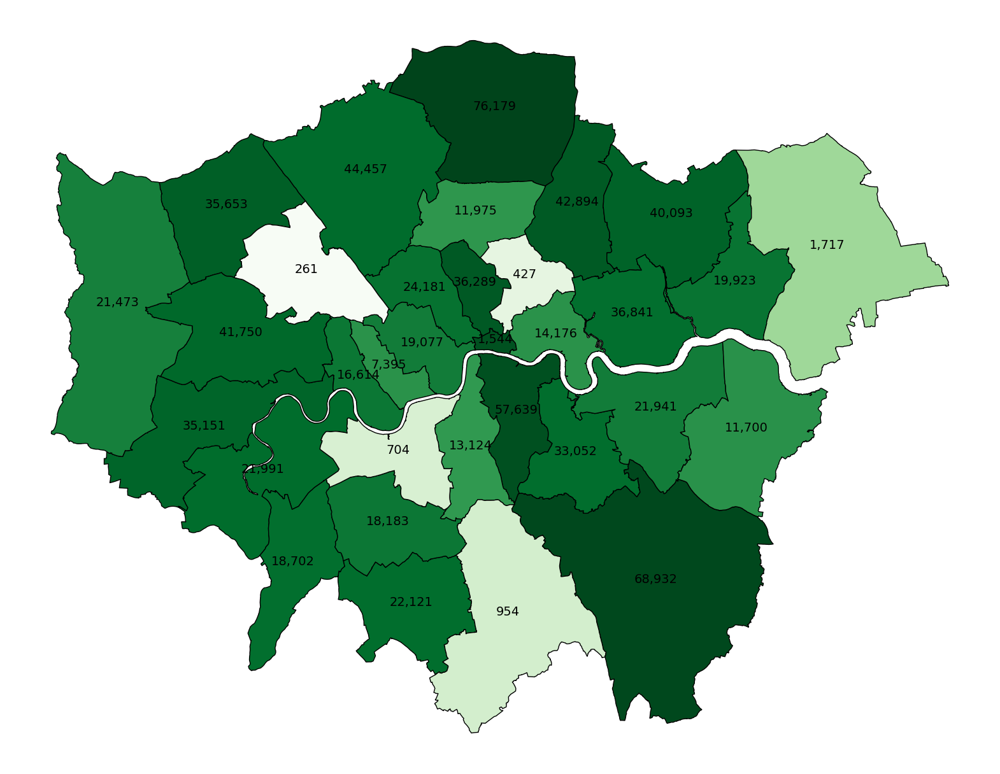

In [36]:
# Normalize color scale
norm = LogNorm(
    vmin=Urban_greenary_df['trees_per_capita'].min(), 
    vmax=Urban_greenary_df['trees_per_capita'].max()
)

# Create the plot
fig, ax = plt.subplots(1, 1, figsize=(20, 20))
Urban_greenary_df.plot(
    ax=ax,
    column='trees_per_capita',
    cmap='Greens',
    edgecolor='k',
    norm=norm,
)

# Add tree counts as annotations
for idx, row in Urban_greenary_df.iterrows():
    # Use the centroid of the polygon for the annotation
    centroid = row['geometry'].centroid
    ax.annotate(
        text=f"{row['tree_count']:,}",  # Format tree count with commas
        xy=(centroid.x, centroid.y),
        horizontalalignment='center',
        fontsize=14,
        color='black',
    )
# Remove axes
ax.axis('off')
plt.title('', fontsize=16)
plt.show()

# Kingston_upon_thames

In [38]:
df =  trees.groupby(['borough', 'condition']).size().reset_index(name='count')
df

,borough,condition,count
0,Kingston upon Thames,Dead,333
1,Kingston upon Thames,Good,1974
2,Kingston upon Thames,Poor,641
3,Kingston upon Thames,Reasonable,15227


In [39]:
Kingston_upon_thames_boundary = london[london['NAME'] == 'Kingston upon Thames']

In [40]:
Kingston_upon_thames = trees[trees['borough'] == 'Kingston upon Thames']

In [41]:
Kingston_upon_thames.head(3)

,objectid,borough,maintainer,taxon_name,common_name,age_group,height_m,canopy_spread_group,dbh_group,longitude,latitude,condition
0,1,Kingston upon Thames,Royal Borough of Kingston upon Thames,Abies grandis,Grand fir,Early mature (16-30),10 to 15m,00 to 05m,21 to 40cm,-0.291147,51.361893,Reasonable
1,2,Kingston upon Thames,Royal Borough of Kingston upon Thames,Abies grandis,Grand fir,Early mature (16-30),10 to 15m,00 to 05m,21 to 40cm,-0.291122,51.361914,Reasonable
2,3,Kingston upon Thames,Royal Borough of Kingston upon Thames,Abies grandis,Grand fir,Early mature (16-30),05 to 10m,05 to 10m,21 to 40cm,-0.290943,51.387016,Reasonable


In [42]:
source_crs = pyproj.CRS("EPSG:4326")
target_crs = pyproj.CRS("EPSG:27700")
transformer = pyproj.Transformer.from_crs(source_crs, target_crs, always_xy=True)
# Define a function to apply the transformation to each row
def transform_coordinates(row):
    x, y = transformer.transform(row['longitude'], row['latitude'])
    return pd.Series({'X': x, 'Y': y})
Kingston_upon_thames.loc[:,['X', 'Y']] = Kingston_upon_thames.apply(transform_coordinates, axis=1)

In [43]:
Kingston_upon_thames = gpd.GeoDataFrame(Kingston_upon_thames, geometry=gpd.points_from_xy(Kingston_upon_thames['X'], Kingston_upon_thames['Y']))
Kingston_upon_thames.head(3)

,objectid,borough,maintainer,taxon_name,common_name,age_group,height_m,canopy_spread_group,dbh_group,longitude,latitude,condition,X,Y,geometry
0,1,Kingston upon Thames,Royal Borough of Kingston upon Thames,Abies grandis,Grand fir,Early mature (16-30),10 to 15m,00 to 05m,21 to 40cm,-0.291147,51.361893,Reasonable,519070.522995,163921.791351,POINT (519070.523 163921.791)
1,2,Kingston upon Thames,Royal Borough of Kingston upon Thames,Abies grandis,Grand fir,Early mature (16-30),10 to 15m,00 to 05m,21 to 40cm,-0.291122,51.361914,Reasonable,519072.182678,163924.102021,POINT (519072.183 163924.102)
2,3,Kingston upon Thames,Royal Borough of Kingston upon Thames,Abies grandis,Grand fir,Early mature (16-30),05 to 10m,05 to 10m,21 to 40cm,-0.290943,51.387016,Reasonable,519019.586301,166715.912918,POINT (519019.586 166715.913)


In [44]:
Kingston_upon_thames = Kingston_upon_thames.drop(["X", "Y"], axis = 1)

In [45]:
Kingston_upon_thames.columns

Index(['objectid', 'borough', 'maintainer', 'taxon_name', 'common_name',
       'age_group', 'height_m', 'canopy_spread_group', 'dbh_group',
       'longitude', 'latitude', 'condition', 'geometry'],
      dtype='object')

In [46]:
Kingston_upon_thames.crs = Kingston_upon_thames_boundary.crs

In [47]:
Kingston_upon_thames.shape

(18702, 13)

In [48]:
Kingston_upon_thames.isnull().sum()

objectid                 0
borough                  0
maintainer               0
taxon_name               0
common_name              0
age_group                0
height_m                 0
canopy_spread_group    527
dbh_group              527
longitude                0
latitude                 0
condition              527
geometry                 0
dtype: int64

In [49]:
Kingston_upon_thames.maintainer.value_counts()

maintainer
Royal Borough of Kingston upon Thames    18175
TfL (Highways)                             527
Name: count, dtype: int64

In [50]:
Kingston_upon_thames.age_group.value_counts()

age_group
Young (0-15)             6722
Early mature (16-30)     6639
Mature (31-80)           4135
Over mature (81-150)     1200
Over mature (81-150)        6
Name: count, dtype: int64

In [51]:
Dead_trees = Kingston_upon_thames[Kingston_upon_thames["condition"] == "Dead"]	
Good_trees = Kingston_upon_thames[Kingston_upon_thames["condition"] == "Good"]	
Poor_trees = Kingston_upon_thames[Kingston_upon_thames["condition"] == "Poor"]	
Reasonable_condition_trees	= Kingston_upon_thames[Kingston_upon_thames["condition"] == "Reasonable"]

In [52]:
Dead_trees.head(3)

,objectid,borough,maintainer,taxon_name,common_name,age_group,height_m,canopy_spread_group,dbh_group,longitude,latitude,condition,geometry
556,544,Kingston upon Thames,Royal Borough of Kingston upon Thames,Acer campestre elegant,Field maple elegant,Young (0-15),00 to 05m,00 to 05m,Upto 10cm,-0.307783,51.404263,Dead,POINT (517803.609 168606.577)
659,644,Kingston upon Thames,Royal Borough of Kingston upon Thames,Acer campestre elsrijk,Field maple elsrijk,Young (0-15),00 to 05m,00 to 05m,Upto 10cm,-0.290199,51.380869,Dead,POINT (519087.291 166033.518)
886,864,Kingston upon Thames,Royal Borough of Kingston upon Thames,Acer davidii,Snakebark maple,Young (0-15),00 to 05m,00 to 05m,11 to 20cm,-0.306997,51.384483,Dead,POINT (517909.082 166408.285)


In [53]:
London_wards = gpd.read_file("statistical-gis-boundaries-london/statistical-gis-boundaries-london/ESRI/London_Ward.shp")

In [54]:
London_wards.crs = Kingston_upon_thames_boundary.crs

In [55]:
Kingston_upon_thames_wards = gpd.clip(London_wards, Kingston_upon_thames_boundary)

In [56]:
trees_in_wards = gpd.sjoin(Kingston_upon_thames, Kingston_upon_thames_wards, how="inner", predicate="within")

In [57]:
# Group by ward and tree condition, count the occurrences
ward_tree_counts = trees_in_wards.groupby(['NAME', 'condition']).size().reset_index(name='count')

In [58]:
ward_trees = ward_tree_counts.pivot(index='NAME', columns='condition', values='count').fillna(0)

# Rename columns
Trees_wardwise = ward_trees.rename(columns={
    "Dead": "Dead_Trees",
    "Good": "Good_condition_Trees",
    "Poor": "Poor_condition_Trees",
    "Reasonable": "Reasonable_condition_Trees"
})

In [59]:
Trees_wardwise

condition,Dead_Trees,Good_condition_Trees,Poor_condition_Trees,Reasonable_condition_Trees
NAME,,,,
Alexandra,31,149,61,1319
Berrylands,21,145,49,859
Beverley,18,189,48,901
Canbury,10,83,18,630
Chessington North and Hook,34,91,46,882
Chessington South,23,155,48,1060
Coombe Hill,31,148,48,1426
Coombe Vale,11,111,29,726
Grove,16,174,28,1040


# Proximity or Access to Good Condition 

In [61]:
from shapely.geometry import Polygon, MultiPolygon

# Get the first geometry (assumes a single boundary)
borough_boundary = Kingston_upon_thames_boundary.to_crs("EPSG:4326")
geometry = borough_boundary.geometry.iloc[0]

# Check if the geometry is a polygon or multipolygon
if geometry.is_valid and isinstance(geometry, (Polygon, MultiPolygon)):
    if isinstance(geometry, Polygon):  # Handle Polygon
        poly_coords = " ".join(f"{y} {x}" for x, y in geometry.exterior.coords)  # Format: lat lon
    elif isinstance(geometry, MultiPolygon):  # Handle MultiPolygon
        # Combine all polygons into one string
        poly_coords = " ".join(
            " ".join(f"{y} {x}" for x, y in poly.exterior.coords)
            for poly in geometry.geoms
        )
else:
    raise ValueError("Invalid or unsupported geometry in shapefile.")

In [62]:
import overpy

api = overpy.Overpass()

# Use the extracted polygon coordinates in the query
query = f"""
[out:json];
(
  way["building"](poly:"{poly_coords}");
);
(._;>;);
out body;
"""

# Run the query
result = api.query(query)

# Print the result summary
print(f"Number of buildings retrieved: {len(result.ways)}")

Number of buildings retrieved: 27521


In [63]:
from shapely.geometry import Polygon

# List to store building polygons
buildings = []

# Iterate through each building way
for way in result.ways:
    # Get coordinates of the building nodes
    coords = [(float(node.lon), float(node.lat)) for node in way.nodes]
    
    # Create a Polygon from the coordinates
    try:
        polygon = Polygon(coords)
    except ValueError:
        # Skip invalid polygons
        continue
    
    # Append building data (geometry only)
    buildings.append({
        "geometry": polygon
    })

# Convert to GeoDataFrame
gdf = gpd.GeoDataFrame(buildings, crs="EPSG:4326")  

# Save as a shapefile
output_path = "buildings.shp"
gdf.to_file(output_path)

print(f"Shapefile saved as {output_path}")


Shapefile saved as buildings.shp


In [64]:
buildings = gpd.read_file("buildings.shp")

In [65]:
buildings.shape

(27521, 2)

In [66]:
from shapely.geometry import Point

# Ensure both datasets use the same CRS
buildings = buildings.to_crs("EPSG:27700")  # Example CRS (UTM Zone)
Good_trees.to_crs = buildings.to_crs

# Calculate distances to the nearest tree for each building
distances = buildings.geometry.apply(lambda b: Good_trees.distance(b).min())
buildings["nearest_tree_distance"] = distances

In [67]:
buildings.shape

(27521, 3)

In [68]:
buildings.head(3)

,FID,geometry,nearest_tree_distance
0,0,"POLYGON ((518132.228 169943.547, 518143.259 16...",60.751935
1,1,"POLYGON ((517903.588 170222.112, 517913.179 17...",17.039307
2,2,"POLYGON ((518594.515 170308.395, 518589.021 17...",140.526254


In [69]:
# Filter buildings within a specific distance (e.g., 10 meters)
buildings_trees_in_100m = buildings[buildings["nearest_tree_distance"] <= 100]
buildings_more_than_100m = buildings[buildings["nearest_tree_distance"] > 100]

In [70]:
buildings_trees_in_100m.shape

(13615, 3)

In [71]:
buildings_more_than_100m.shape

(13906, 3)

In [72]:
import folium
from folium.plugins import MarkerCluster

# Ensure all GeoDataFrames use the same CRS
buildings = buildings.to_crs("EPSG:4326")
Good_trees = Good_trees.to_crs("EPSG:4326")
Kingston_upon_thames_boundary = Kingston_upon_thames_boundary.to_crs("EPSG:4326")
Kingston_upon_thames_wards = Kingston_upon_thames_wards.to_crs("EPSG:4326")

m = folium.Map(location=[51.404263, -0.289783], zoom_start=15)
		
# Add Kingston boundary to the map
folium.GeoJson(
    Kingston_upon_thames_boundary.geometry,
    name="Kingston Boundary",
    style_function=lambda x: {
        'color': 'black',
        'weight': 2,
        'fillOpacity': 0,
    }
).add_to(m)

In [73]:
# Add Kingston wards to the map
folium.GeoJson(
    Kingston_upon_thames_wards.geometry,
    name="Kingston Wards",
    style_function=lambda x: {
        'color': 'black',
        'weight': 1,
        'fillOpacity': 0,
    }
).add_to(m)

In [74]:
folium.GeoJson(
    buildings_trees_in_100m.geometry,
    name="Buildings within Proximity of Good Condition trees",
    style_function=lambda x: {
        'color': 'blue',
        'weight': 1,
        'fillOpacity': 0.6,
    }
).add_to(m)

In [75]:
# Add buildings more than 100m to the map (red)
folium.GeoJson(
    buildings_more_than_100m.geometry,
    name="Buildings not in Proximity of Good Condition trees",
    style_function=lambda x: {
        'color': 'red',
        'weight': 1,
        'fillOpacity': 0.6,
    },
).add_to(m)

In [76]:
title_html = '''
<div style="position: fixed; 
            top: 10px; left: 50%; transform: translate(-50%, 0);
            font-size: 24px; font-weight: bold; color: black;">
    Urban Greenery Analysis - Access to Good condition
</div>
'''

m.get_root().html.add_child(folium.Element(title_html))

In [77]:
# Add a layer control for toggling layers
folium.LayerControl().add_to(m)

# Save map to an HTML file
m.save("map.html")

# Display the map
m